In [1]:
!pip install kaggle

In [2]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sayurigh","key":"2e8b7785e993aa5afda16d197d2cebc0"}'}

In [3]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [4]:
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces


Dataset URL: https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces
License(s): other
100% 3.74G/3.75G [00:52<00:00, 35.7MB/s]
100% 3.75G/3.75G [00:52<00:00, 77.3MB/s]


In [5]:

!unzip 140k-real-and-fake-faces.zip -d dataset

Streaming output truncated to the last 5000 lines.
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34832.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34836.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34839.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34847.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34848.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34852.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34861.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34864.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34868.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34877.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34883.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34887.jpg  
  inflating: dataset/real_vs_fake/real-vs-fake/valid/real/34891.jpg  
  inflating: dataset/real_vs_fake/real-

In [6]:
import os

for root, dirs, files in os.walk("dataset/real_vs_fake"):
    level = root.replace("dataset/real_vs_fake", "").count(os.sep)
    indent = " " * 4 * level
    print(f"{indent}{os.path.basename(root)}/ ({len(files)} files)")


real_vs_fake/ (0 files)
    real-vs-fake/ (0 files)
        train/ (0 files)
            real/ (50000 files)
            fake/ (50000 files)
        test/ (0 files)
            real/ (10000 files)
            fake/ (10000 files)
        valid/ (0 files)
            real/ (10000 files)
            fake/ (10000 files)


In [7]:
TRAIN_PATH = "/content/dataset/real_vs_fake/real-vs-fake/train"
VAL_PATH = "/content/dataset/real_vs_fake/real-vs-fake/valid"
TEST_PATH = "/content/dataset/real_vs_fake/real-vs-fake/test"


In [8]:
!ls /content
!ls /content/dataset
!ls /content/dataset/real_vs_fake
!find /content/dataset/real_vs_fake/real-vs-fake -maxdepth 2 -type d

140k-real-and-fake-faces.zip  dataset  kaggle.json  sample_data
real_vs_fake  test.csv	train.csv  valid.csv
real-vs-fake
/content/dataset/real_vs_fake/real-vs-fake
/content/dataset/real_vs_fake/real-vs-fake/train
/content/dataset/real_vs_fake/real-vs-fake/train/real
/content/dataset/real_vs_fake/real-vs-fake/train/fake
/content/dataset/real_vs_fake/real-vs-fake/test
/content/dataset/real_vs_fake/real-vs-fake/test/real
/content/dataset/real_vs_fake/real-vs-fake/test/fake
/content/dataset/real_vs_fake/real-vs-fake/valid
/content/dataset/real_vs_fake/real-vs-fake/valid/real
/content/dataset/real_vs_fake/real-vs-fake/valid/fake


In [9]:
print("✅ Paths set:")
print(f"Train: {len(os.listdir(TRAIN_PATH))} classes -> {os.listdir(TRAIN_PATH)}")
print(f"Val: {len(os.listdir(VAL_PATH))} classes -> {os.listdir(VAL_PATH)}")
print(f"Test: {len(os.listdir(TEST_PATH))} classes -> {os.listdir(TEST_PATH)}")

✅ Paths set:
Train: 2 classes -> ['real', 'fake']
Val: 2 classes -> ['real', 'fake']
Test: 2 classes -> ['real', 'fake']


In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import tensorflow as tf


Found 100000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
Found 20000 images belonging to 2 classes.
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,213,668 (16.07 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 1313s 411ms/step - accuracy: 0.4993 - loss: 0.6964 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 2/5
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 1156s 370ms/step - accuracy: 0.4990 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 3/5
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 1137s 364ms/step - accuracy: 0.4995 - loss: 0.6933 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 4/5
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 1135s 363ms/step - accuracy: 0.4997 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 5/5
3125/3125 ━━━━━━━━━━━━━━━━━━━━ 1138s 364ms/step - accuracy: 0.4996 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6932


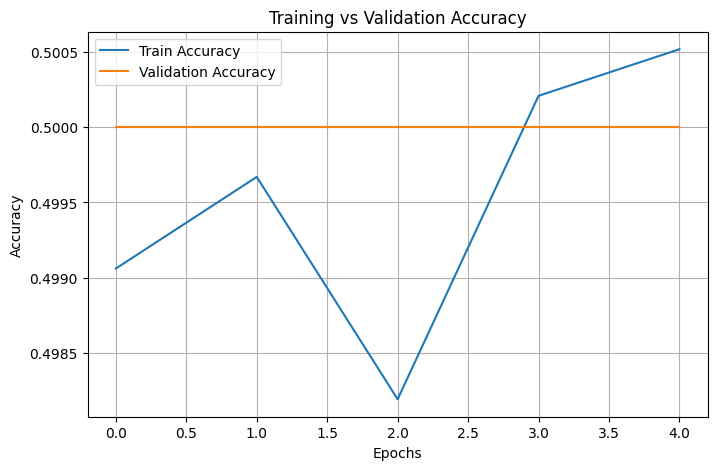

In [ ]:
# --- DATA PREPARATION ---
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_gen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=15,
    zoom_range=0.1
)
val_gen = ImageDataGenerator(rescale=1./255)
test_gen = ImageDataGenerator(rescale=1./255)

train_data = train_gen.flow_from_directory(
    TRAIN_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary'
)
val_data = val_gen.flow_from_directory(
    VAL_PATH,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary'
)
test_data = test_gen.flow_from_directory(
    TEST_PATH,
    target_size=IMG_SIZE,
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

# ---  MODEL ---
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')  

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

# ---  TRAINING ---
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=5
)

# ---  VISUALIZE TRAINING RESULTS ---
plt.figure(figsize=(8,5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import os


print(os.listdir("/content/dataset/real_vs_fake/real-vs-fake/test"))


print(os.listdir("/content/dataset/real_vs_fake/real-vs-fake/test/fake")[:5])  # show first 5


['real', 'fake']
['TOW2C81GP2.jpg', 'XS18R2YUYL.jpg', 'M2CG0UREXT.jpg', 'FKNSBNL8AU.jpg', '6TLS1D8SKA.jpg']


🟢 Real Image: 00725.jpg


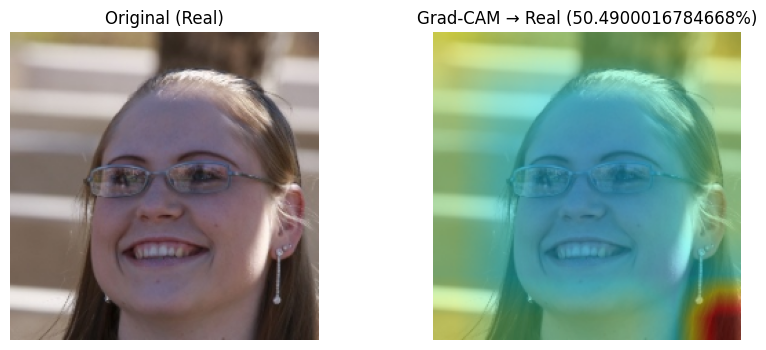

🔴 Fake Image: DBZNV6FUJU.jpg


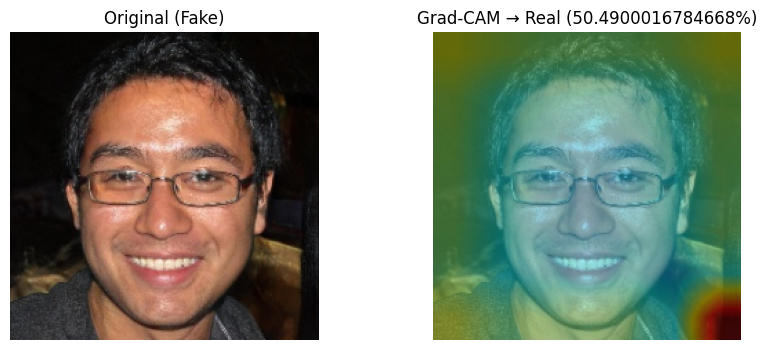

In [ ]:
# --- GRAD-CAM FOR EFFICIENTNET + SEQUENTIAL MODEL ---

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2, os, random
from tensorflow.keras.models import Model


def get_img_array(path, size=(224,224)):
    img = tf.keras.utils.load_img(path, target_size=size)
    arr = tf.keras.utils.img_to_array(img)
    return np.expand_dims(arr/255., 0)

def gradcam_on_efficientnet(model, img_array):
    """Generate Grad-CAM heatmap using EfficientNet backbone"""
    eff = model.get_layer('efficientnetb0')
    last_conv = eff.get_layer('top_conv')

    grad_model = Model(inputs=eff.input,
                       outputs=[last_conv.output, eff.output])

    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(img_array)
        loss = preds[:, 0]

    grads = tape.gradient(loss, conv_out)
    weights = tf.reduce_mean(grads, axis=(0,1,2))
    cam = tf.reduce_sum(tf.multiply(weights, conv_out[0]), axis=-1)

    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-10)
    return cam  

def show_gradcam(path, model, label):
    """Display Grad-CAM heatmap overlay"""
    arr = get_img_array(path)
    heat = gradcam_on_efficientnet(model, arr)

    pred = model.predict(arr, verbose=0)[0][0]
    pred_lab = "Fake" if pred>0.5 else "Real"
    conf = round(pred*100,2) if pred>0.5 else round((1-pred)*100,2)

    img = cv2.imread(path)
    img = cv2.resize(img,(224,224))
    heat = cv2.resize(heat,(224,224))
    heat = np.uint8(255*heat)
    heat = cv2.applyColorMap(heat, cv2.COLORMAP_JET)
    blend = cv2.addWeighted(img,0.6,heat,0.4,0)

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.title(f"Original ({label})"); plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(blend,cv2.COLOR_BGR2RGB))
    plt.title(f"Grad-CAM → {pred_lab} ({conf}%)"); plt.axis("off")
    plt.show()

# ----------------- test -----------------
real_dir = "/content/dataset/real_vs_fake/real-vs-fake/test/real"
fake_dir = "/content/dataset/real_vs_fake/real-vs-fake/test/fake"

r_img = os.path.join(real_dir, random.choice(os.listdir(real_dir)))
f_img = os.path.join(fake_dir, random.choice(os.listdir(fake_dir)))

print("🟢 Real Image:", os.path.basename(r_img))
show_gradcam(r_img, model, "Real")

print("🔴 Fake Image:", os.path.basename(f_img))
show_gradcam(f_img, model, "Fake")


In [ ]:
# --- EVALUATION ---
loss, acc = model.evaluate(test_data)
print(f"\n✅ Test Accuracy: {acc*100:.2f}%")

# --- SAVE MODEL ---
model.save("ai_image_detector.h5")
print("💾 Model saved as ai_image_detector.h5")

# --- STEP 9: PREDICT ON A SINGLE IMAGE ---
def predict_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224,224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)/255.
    img_array = np.expand_dims(img_array, axis=0)
    prediction = model.predict(img_array)[0][0]

    if prediction > 0.5:
        print("🔴 AI-generated Image Detected (Confidence:", round(prediction*100,2),"%)")
    else:
        print("🟢 Real Image Detected (Confidence:", round((1-prediction)*100,2),"%)")



20000/20000 ━━━━━━━━━━━━━━━━━━━━ 179s 8ms/step - accuracy: 0.8465 - loss: 0.6863



✅ Test Accuracy: 50.00%
💾 Model saved as ai_image_detector.h5


20000/20000 ━━━━━━━━━━━━━━━━━━━━ 154s 7ms/step


<Figure size 600x600 with 0 Axes>

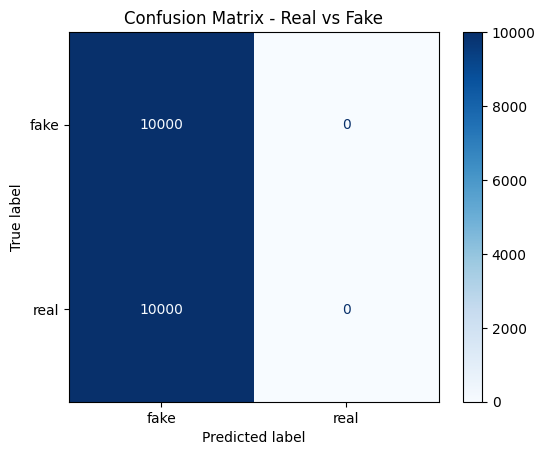


Classification Report:

              precision    recall  f1-score   support

        fake       0.50      1.00      0.67     10000
        real       0.00      0.00      0.00     10000

    accuracy                           0.50     20000
   macro avg       0.25      0.50      0.33     20000
weighted avg       0.25      0.50      0.33     20000



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# --- CONFUSION MATRIX & CLASSIFICATION REPORT ---

from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt


y_true = test_data.classes
y_pred_probs = model.predict(test_data, verbose=1)
y_pred = (y_pred_probs > 0.5).astype(int).reshape(-1)


cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(test_data.class_indices.keys()))


plt.figure(figsize=(6, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix - Real vs Fake")
plt.show()


print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=list(test_data.class_indices.keys())))


🖼️ Image: BR9M4SICL2.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


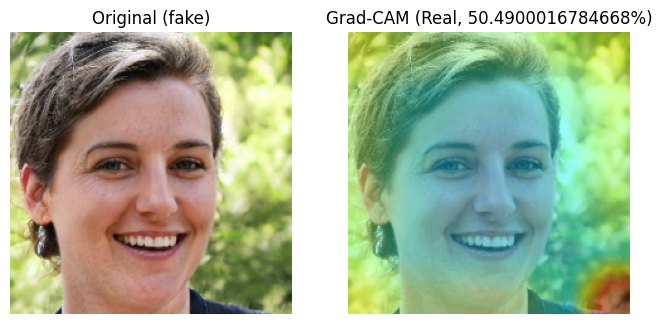

🖼️ Image: W4NQHVWH7D.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


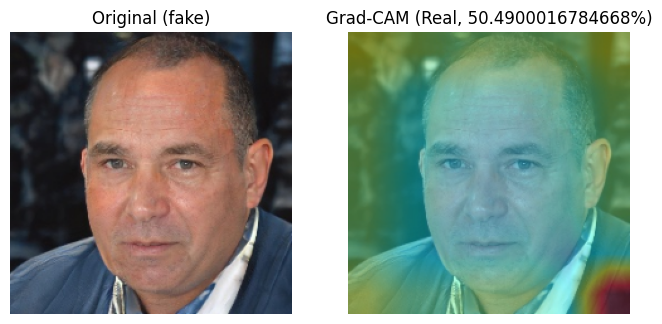

🖼️ Image: K5JWF9IMOF.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


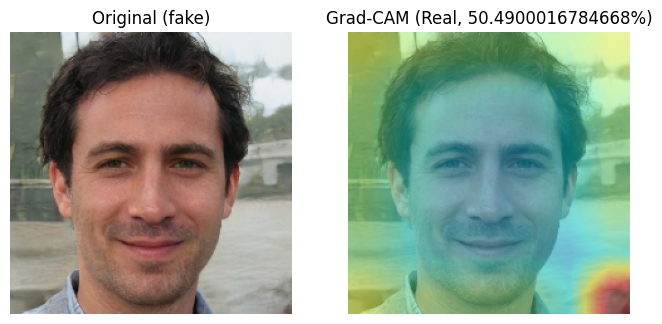

🖼️ Image: HNK252EJT4.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


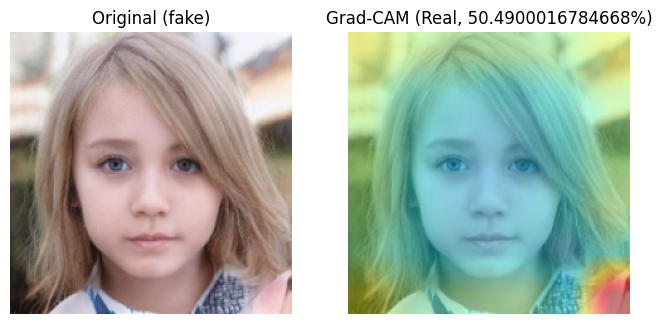

🖼️ Image: 18637.jpg
🧠 Actual: REAL | Predicted: REAL (50.4900016784668% confidence)


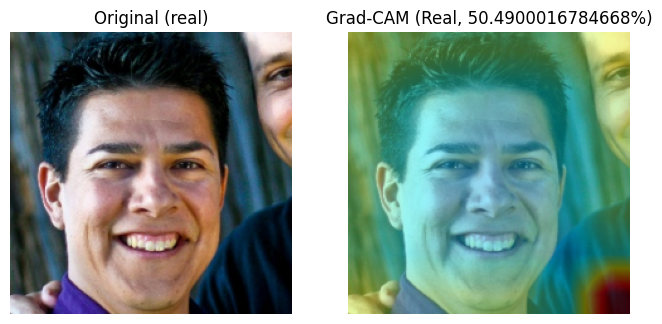

In [ ]:
# --- EXTRA EDGE: AUTO-EXPLAINABILITY DASHBOARD ---

import random, os

def auto_explain_predictions(model, test_dir, num_samples=5):
    """Pick random test images, predict, and visualize Grad-CAM results."""

    
    image_paths, class_labels = [], []
    for label in os.listdir(test_dir):
        folder = os.path.join(test_dir, label)
        for file in os.listdir(folder):
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(folder, file))
                class_labels.append(label)

    
    samples = random.sample(list(zip(image_paths, class_labels)), num_samples)

    for img_path, label in samples:
        img_array = get_img_array(img_path, size=(224, 224))
        pred_prob = model.predict(img_array, verbose=0)[0][0]
        prediction = "Fake" if pred_prob > 0.5 else "Real"
        confidence = round(pred_prob * 100, 2) if pred_prob > 0.5 else round((1 - pred_prob) * 100, 2)

        print(f"🖼️ Image: {os.path.basename(img_path)}")
        print(f"🧠 Actual: {label.upper()} | Predicted: {prediction.upper()} ({confidence}% confidence)")

        
        heatmap = gradcam_on_efficientnet(model, img_array)

        
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

       
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Original ({label})")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Grad-CAM ({prediction}, {confidence}%)")
        plt.axis("off")

        plt.show()


auto_explain_predictions(model, TEST_PATH, num_samples=5)


🖼️ Image: 42301.jpg
🧠 Actual: REAL | Predicted: REAL (50.4900016784668% confidence)


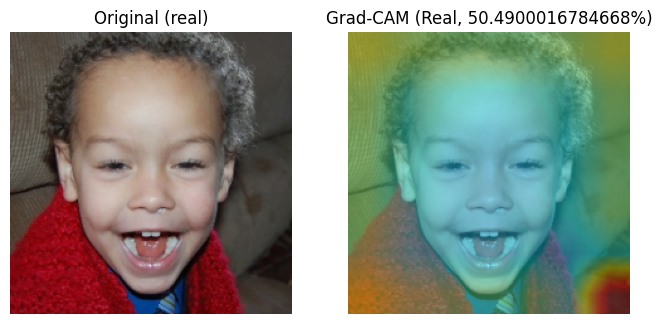

🖼️ Image: V3PTG8T9VG.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


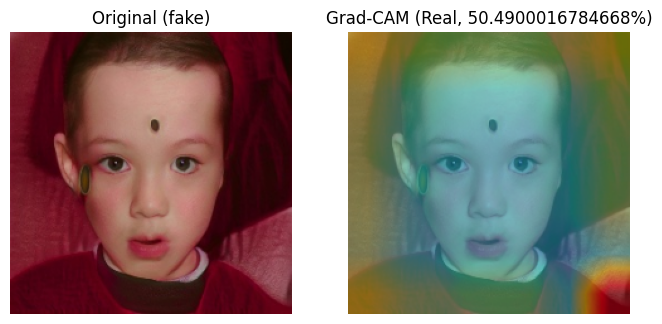

🖼️ Image: LRM93TTS39.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


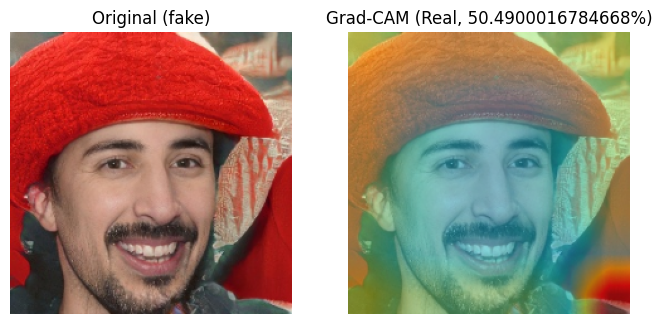

🖼️ Image: 19363.jpg
🧠 Actual: REAL | Predicted: REAL (50.4900016784668% confidence)


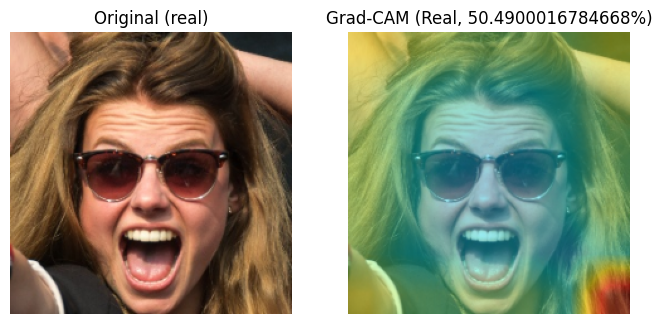

🖼️ Image: M2IL22H084.jpg
🧠 Actual: FAKE | Predicted: REAL (50.4900016784668% confidence)


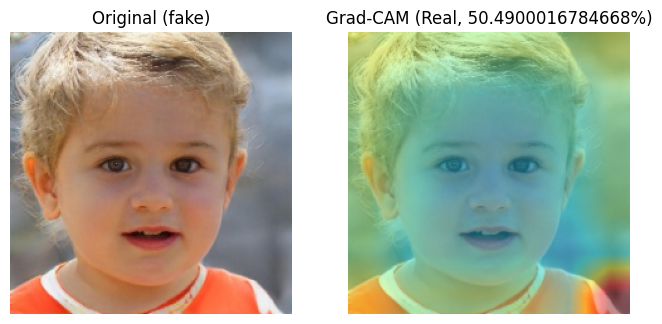

In [ ]:
# --- EXTRA EDGE: AUTO-EXPLAINABILITY DASHBOARD---

import random, os

def auto_explain_predictions(model, test_dir, num_samples=5):
    """Pick random test images, predict, and visualize Grad-CAM results."""

    
    image_paths, class_labels = [], []
    for label in os.listdir(test_dir):
        folder = os.path.join(test_dir, label)
        for file in os.listdir(folder):
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(folder, file))
                class_labels.append(label)

    samples = random.sample(list(zip(image_paths, class_labels)), num_samples)

    for img_path, label in samples:
        img_array = get_img_array(img_path, size=(224, 224))
        pred_prob = model.predict(img_array, verbose=0)[0][0]
        prediction = "Fake" if pred_prob > 0.5 else "Real"
        confidence = round(pred_prob * 100, 2) if pred_prob > 0.5 else round((1 - pred_prob) * 100, 2)

        print(f"🖼️ Image: {os.path.basename(img_path)}")
        print(f"🧠 Actual: {label.upper()} | Predicted: {prediction.upper()} ({confidence}% confidence)")

        
        heatmap = gradcam_on_efficientnet(model, img_array)

        
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

        
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Original ({label})")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Grad-CAM ({prediction}, {confidence}%)")
        plt.axis("off")

        plt.show()



auto_explain_predictions(model, TEST_PATH, num_samples=5)


Saving 12024002035241.jpg to 12024002035241.jpg

✅ Uploaded file: 12024002035241.jpg
🧠 Prediction: REAL (50.4900016784668% confidence)


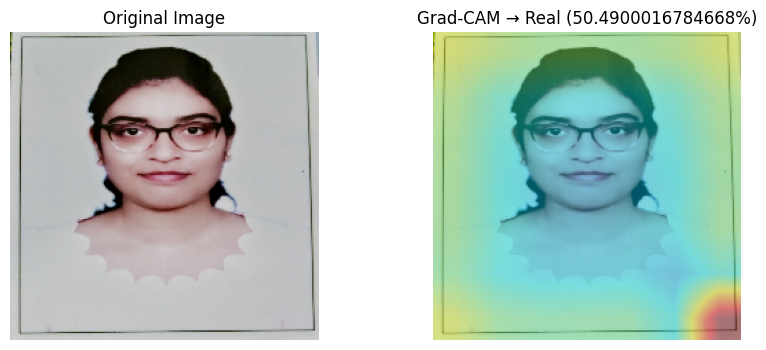

In [ ]:
# --- MANUAL IMAGE UPLOAD + GRAD-CAM VISUALIZATION ---

from google.colab import files
import os


uploaded = files.upload()  
for fn in uploaded.keys():
    image_path = os.path.join("/content", fn)
    print(f"\n✅ Uploaded file: {fn}")

    
    arr = get_img_array(image_path)
    heatmap = gradcam_on_efficientnet(model, arr)

    
    pred = model.predict(arr, verbose=0)[0][0]
    pred_label = "Fake" if pred > 0.5 else "Real"
    confidence = round(pred * 100, 2) if pred > 0.5 else round((1 - pred) * 100, 2)

    
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    blended = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    
    print(f"🧠 Prediction: {pred_label.upper()} ({confidence}% confidence)")

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
    plt.title(f"Grad-CAM → {pred_label} ({confidence}%)")
    plt.axis("off")
    plt.show()


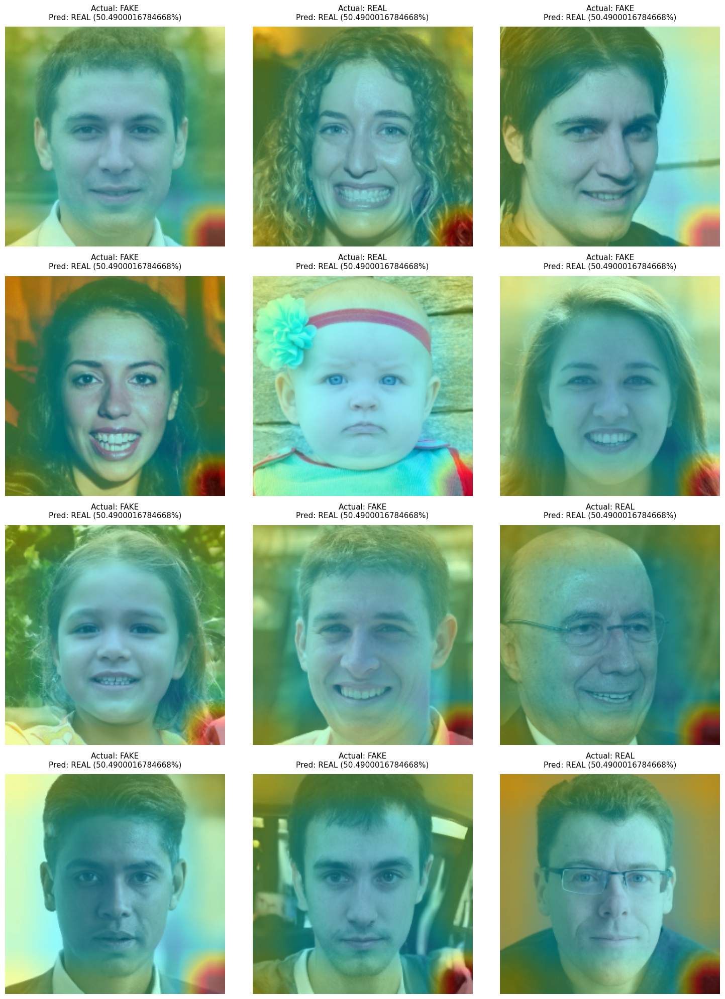

In [ ]:
# --- GRAD-CAM DASHBOARD FOR MULTIPLE IMAGES ---

import random, math
import matplotlib.pyplot as plt
import cv2, os
import numpy as np

def gradcam_dashboard(model, test_dir, num_samples=6):
    """Displays a dashboard of Grad-CAM results for random test images."""
    
    image_paths, labels = [], []
    for label in os.listdir(test_dir):
        folder = os.path.join(test_dir, label)
        for file in os.listdir(folder):
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(folder, file))
                labels.append(label)

    
    samples = random.sample(list(zip(image_paths, labels)), num_samples)

    
    cols = 3
    rows = math.ceil(len(samples) / cols)
    plt.figure(figsize=(15, rows * 5))

    for i, (img_path, label) in enumerate(samples):
        img_array = get_img_array(img_path)
        heatmap = gradcam_on_efficientnet(model, img_array)

        
        pred = model.predict(img_array, verbose=0)[0][0]
        pred_label = "Fake" if pred > 0.5 else "Real"
        conf = round(pred * 100, 2) if pred > 0.5 else round((1 - pred) * 100, 2)

        
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        heatmap = cv2.resize(heatmap, (224, 224))
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.title(
            f"Actual: {label.upper()}\nPred: {pred_label.upper()} ({conf}%)",
            fontsize=11, color="black", pad=10
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()



gradcam_dashboard(model, TEST_PATH, num_samples=12)


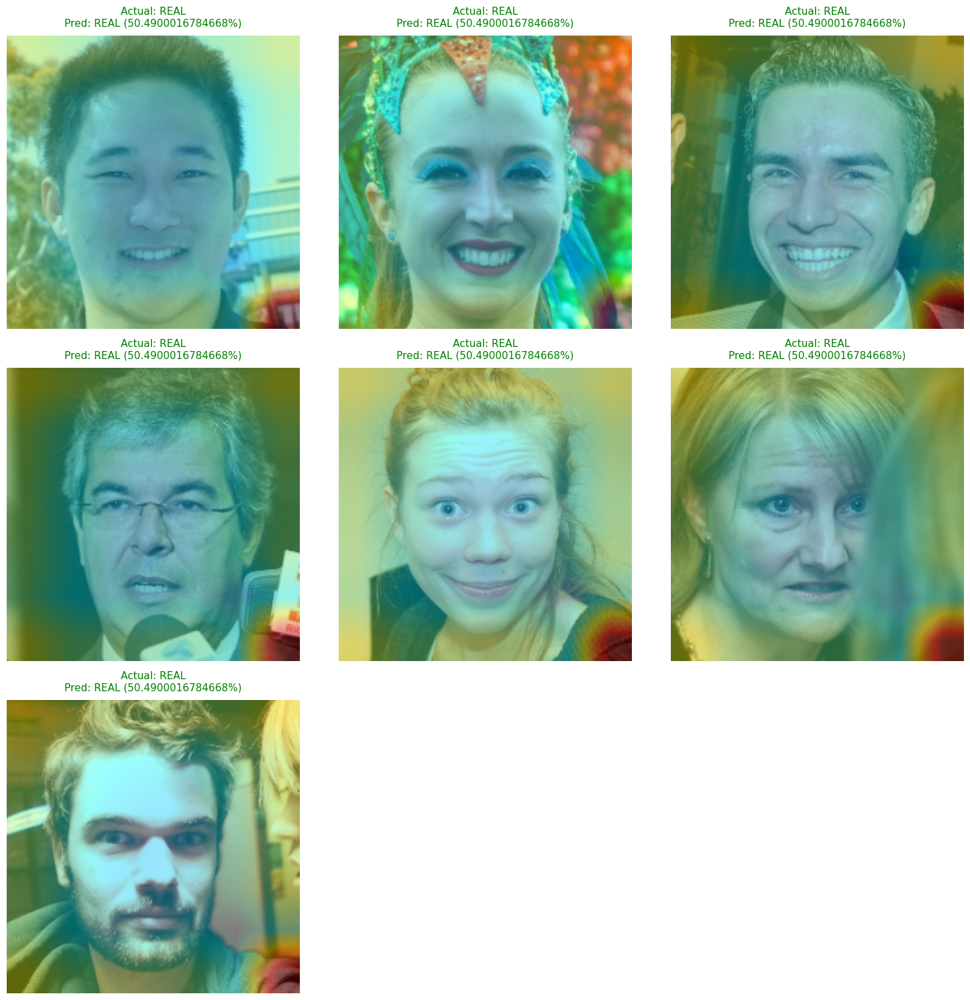

In [ ]:
# --- GRAD-CAM DASHBOARD: SHOW ONLY CORRECT PREDICTIONS ---

import random, math
import matplotlib.pyplot as plt
import cv2, os
import numpy as np

def gradcam_dashboard_correct(model, test_dir, num_samples=10):
    """Displays Grad-CAM overlays only for correctly predicted samples."""
    image_paths, labels = [], []
    for label in os.listdir(test_dir):
        folder = os.path.join(test_dir, label)
        for file in os.listdir(folder):
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(folder, file))
                labels.append(label)

    
    samples = random.sample(list(zip(image_paths, labels)), num_samples)
    correct_samples = []

    for img_path, actual_label in samples:
        img_array = get_img_array(img_path)
        pred_prob = model.predict(img_array, verbose=0)[0][0]
        predicted_label = "fake" if pred_prob > 0.5 else "real"

        if predicted_label.lower() == actual_label.lower():
            correct_samples.append((img_path, actual_label, pred_prob))

    if not correct_samples:
        print("⚠️ No correctly predicted samples in this batch. Try increasing num_samples.")
        return

    
    cols = 3
    rows = math.ceil(len(correct_samples) / cols)
    plt.figure(figsize=(15, rows * 5))

    for i, (img_path, actual_label, pred_prob) in enumerate(correct_samples):
        img_array = get_img_array(img_path)
        heatmap = gradcam_on_efficientnet(model, img_array)

        pred_label = "Fake" if pred_prob > 0.5 else "Real"
        conf = round(pred_prob * 100, 2) if pred_prob > 0.5 else round((1 - pred_prob) * 100, 2)

        
        img = cv2.imread(img_path)
        img = cv2.resize(img, (224, 224))
        heatmap = cv2.resize(heatmap, (224, 224))
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        plt.title(
            f"Actual: {actual_label.upper()}\nPred: {pred_label.upper()} ({conf}%)",
            fontsize=11, color="green", pad=10
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()



gradcam_dashboard_correct(model, TEST_PATH, num_samples=12)


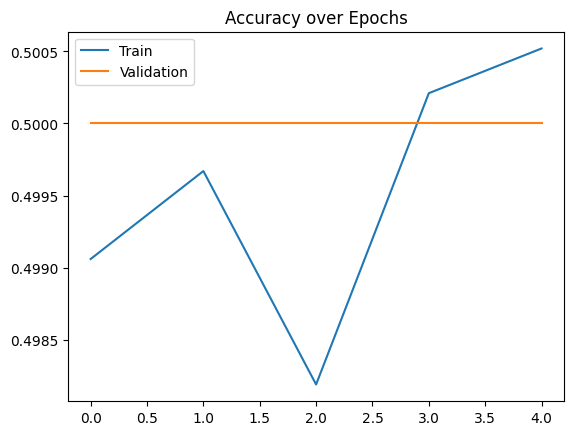

In [37]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy over Epochs')
plt.legend()
plt.show()


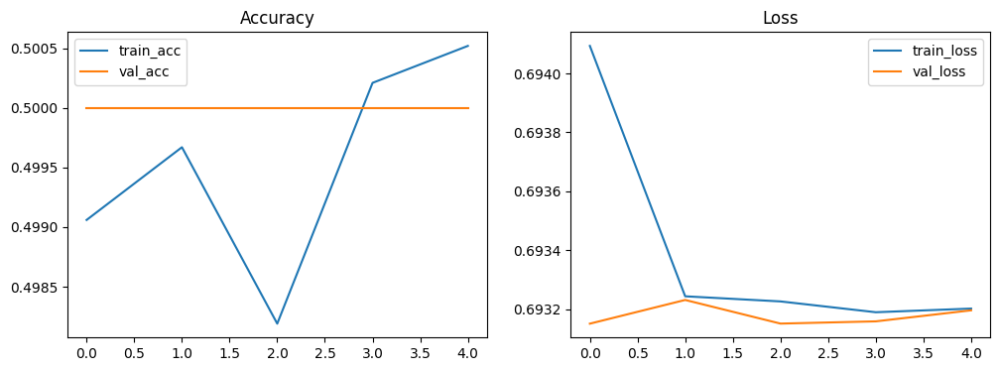

Class indices (train): {'fake': 0, 'real': 1}
Train counts: {'real': 50000, 'fake': 50000}
Val counts: {'real': 10000, 'fake': 10000}
Test counts: {'real': 10000, 'fake': 10000}


In [ ]:
# --- DIAGNOSTIC CELLS ---

import matplotlib.pyplot as plt
import numpy as np
import os
from collections import Counter


try:
   
    plt.figure(figsize=(12,4))
    if 'accuracy' in history.history:
        plt.subplot(1,2,1)
        plt.plot(history.history['accuracy'], label='train_acc')
        plt.plot(history.history['val_accuracy'], label='val_acc')
        plt.title('Accuracy')
        plt.legend()
    if 'loss' in history.history:
        plt.subplot(1,2,2)
        plt.plot(history.history['loss'], label='train_loss')
        plt.plot(history.history['val_loss'], label='val_loss')
        plt.title('Loss')
        plt.legend()
    plt.show()
except NameError:
    print("No 'history' object found. Skip plotting training curves.")


try:
    print("Class indices (train):", train_data.class_indices)
except NameError:
    print("train_data not found in memory.")

def count_folder(folder):
    if not os.path.exists(folder):
        return {}
    counts = {}
    for cl in os.listdir(folder):
        p = os.path.join(folder, cl)
        if os.path.isdir(p):
            counts[cl] = len([f for f in os.listdir(p) if f.lower().endswith(('.jpg','.jpeg','.png'))])
    return counts

train_counts = count_folder(TRAIN_PATH)
val_counts   = count_folder(VAL_PATH)
test_counts  = count_folder(TEST_PATH)
print("Train counts:", train_counts)
print("Val counts:", val_counts)
print("Test counts:", test_counts)
